Import Package

In [2]:
import os
import numpy as np
import pandas as pd
import nltk


from nltk.tokenize import sent_tokenize, word_tokenize 
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer 
from nltk.corpus import wordnet
from nltk.tag import pos_tag
import re
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize


#NLP
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
import emoji

#Viz
from matplotlib import pyplot as plt
import seaborn as sns


# Model
import random
import torch

import math
import torch
from transformers.activations import gelu
from transformers import (BertTokenizer, BertConfig, 
                          BertForSequenceClassification, BertPreTrainedModel, 
                          apply_chunking_to_forward, set_seed,
                          )
from transformers.modeling_outputs import (BaseModelOutputWithPastAndCrossAttentions, 
                                           BaseModelOutputWithPoolingAndCrossAttentions, 
                                           SequenceClassifierOutput,
                                           )

import mxnet as mx
from bert_embedding import BertEmbedding
from sentence_transformers import SentenceTransformer


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Ichvan\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Ichvan\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Ichvan\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Ichvan\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
c:\Users\Ichvan\AppData\Local\Programs\Python\Python38\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


read data

In [15]:
# Read Data
data = pd.read_csv("C:\\Users\\Ichvan\\Documents\\Kuliah\\Skripsi\\DATASET\\review_movie_raw.csv")
df = pd.DataFrame(data)

movie = pd.DataFrame(data, columns=['review_movie'])
print(movie)

                                           review_movie
0     Tim Burton's BATMAN is for people who take com...
1     Having, losing, gaining... to a generation of ...
2     I seriously hope that the director intended th...
3     As a story of a super hero goes, this Batman d...
4     This is not the Tim Burton, Michael Keaton "Ba...
...                                                 ...
3360  This film, in a sense, trumped all superhero m...
3361  Watchmen centers around a variety of very huma...
3362  Watchmen. My favorite book of all time. One of...
3363  Watchmen is directed by Zack Snyder and adapte...
3364  I have never disappointed in snyder work, this...

[3365 rows x 1 columns]


mengecek apakah ada duplikasi data

In [156]:
# Mengecek duplikasi
dupes = movie.duplicated()
# Menampilkan jumlah duplikasi
print(f"Jumlah duplikasi: {dupes.sum()}")
# Menampilkan baris yang duplikat (jika ada)
if dupes.any():
    print("Baris yang duplikat:")
    print(df[dupes])

Jumlah duplikasi: 2
Baris yang duplikat:
                                          review_movie  rating_movie
280  I don't know why critics cal it bizarre and ma...          10.0
447  BATMAN FOREVER is okay and this is short.The f...           7.0


penghapus duplikasi data

In [157]:
# Menghapus duplikasi
movie = movie.drop_duplicates()

<h1>Cleaning Data</h1>

In [16]:
# List of characters to clean
character = ['.',',',';',':','-','...','?','!','(',')','[',']','{','}','<','>','"','/','\'','#','-','@',
             'a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z',
             'A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z']

# Function to remove repeated characters
def repeatcharClean(text): 
    for i in range(len(character)):
        charac_long = 5
        while charac_long > 2:
            char = character[i]*charac_long 
            text = text.replace(char,character[i])
            charac_long -= 1
    return text

# Function to clean review text
def clean_review(text):
    # Replace newline with space
    text = re.sub(r'\n', ' ', text)
    # Remove links
    text = re.sub(r"(https?:\/\/(?:www\.|(?!www))[a-zA-Z0-9][a-zA-Z0-9-]+[a-zA-Z0-9]\.[^\s]{2,}|www\.[a-zA-Z0-9][a-zA-Z0-9-]+[a-zA-Z0-9]\.[^\s]{2,}|https?:\/\/(?:www\.|(?!www))[a-zA-Z0-9]+\.[^\s]{2,}|www\.[a-zA-Z0-9]+\.[^\s]{2,})", "", text)
    # Remove hashtags
    text = re.sub(r'#(\S+)', r'\1', text)
    # Remove numbers and symbols
    text = re.sub('[^a-zA-Z]+', ' ', text)
    text = re.sub(r'[.,]', '', text)
    # Remove repeated characters
    text = repeatcharClean(text)
    # Remove extra spaces
    text = re.sub('[ ]+', ' ', text)
    
    
    
    return text

In [17]:
movie['cleaned_review'] = movie['review_movie'].apply(clean_review)
movie

,review_movie,cleaned_review
0,Tim Burton's BATMAN is for people who take com...,Tim Burton s BATMAN is for people who take com...
1,"Having, losing, gaining... to a generation of ...",Having losing gaining to a generation of kids ...
2,I seriously hope that the director intended th...,I seriously hope that the director intended th...
3,"As a story of a super hero goes, this Batman d...",As a story of a super hero goes this Batman di...
4,"This is not the Tim Burton, Michael Keaton ""Ba...",This is not the Tim Burton Michael Keaton Batm...
...,...,...
3360,"This film, in a sense, trumped all superhero m...",This film in a sense trumped all superhero mov...
3361,Watchmen centers around a variety of very huma...,Watchmen centers around a variety of very huma...
3362,Watchmen. My favorite book of all time. One of...,Watchmen My favorite book of all time One of t...
3363,Watchmen is directed by Zack Snyder and adapte...,Watchmen is directed by Zack Snyder and adapte...


menyimpan hasil cleaning

In [160]:
# Menyimpan DataFrame yang sudah dibersihkan ke CSV
movie.to_csv('cleaned_reviews.csv', index=False)

Data yang sudah dibersihkan telah disimpan ke 'cleaned_reviews.csv'


In [53]:
movie['cleaned_review'].to_csv('label_review.csv', index=False)


<h1>CASEFOLDING</h1>

In [27]:
# Read Data
file_path = "C:\\Users\\Ichvan\\Documents\\Kuliah\\Skripsi\\apps\\cleaned_reviews.csv"
df = pd.read_csv(file_path)

print(df)

                                           review_movie  \
0     Tim Burton's BATMAN is for people who take com...   
1     Having, losing, gaining... to a generation of ...   
2     I seriously hope that the director intended th...   
3     As a story of a super hero goes, this Batman d...   
4     This is not the Tim Burton, Michael Keaton "Ba...   
...                                                 ...   
3358  This film, in a sense, trumped all superhero m...   
3359  Watchmen centers around a variety of very huma...   
3360  Watchmen. My favorite book of all time. One of...   
3361  Watchmen is directed by Zack Snyder and adapte...   
3362  I have never disappointed in snyder work, this...   

                                         cleaned_review  
0     Tim Burton s BATMAN is for people who take com...  
1     Having losing gaining to a generation of kids ...  
2     I seriously hope that the director intended th...  
3     As a story of a super hero goes this Batman di...  
4

fungsi casefolding

In [28]:
# Function to apply casefolding
def casefolding(text):
    text = text.lower()
    text = text.strip()
    return text

# Apply casefolding to the 'cleaned_review' column
df['casefolding'] = df['cleaned_review'].apply(casefolding)

# Print the dataframe with the new casefolding column
print(df)

                                           review_movie  \
0     Tim Burton's BATMAN is for people who take com...   
1     Having, losing, gaining... to a generation of ...   
2     I seriously hope that the director intended th...   
3     As a story of a super hero goes, this Batman d...   
4     This is not the Tim Burton, Michael Keaton "Ba...   
...                                                 ...   
3358  This film, in a sense, trumped all superhero m...   
3359  Watchmen centers around a variety of very huma...   
3360  Watchmen. My favorite book of all time. One of...   
3361  Watchmen is directed by Zack Snyder and adapte...   
3362  I have never disappointed in snyder work, this...   

                                         cleaned_review  \
0     Tim Burton s BATMAN is for people who take com...   
1     Having losing gaining to a generation of kids ...   
2     I seriously hope that the director intended th...   
3     As a story of a super hero goes this Batman di...

In [29]:
# Save the resulting dataframe to a new CSV file

df.to_csv("C:\\Users\\Ichvan\\Documents\\Kuliah\\Skripsi\\apps\\casefolded_reviews.csv", index=False)

<h1>STOPWORDS REMOVAL</h1>

In [30]:
file_path = "C:\\Users\\Ichvan\\Documents\\Kuliah\\Skripsi\\apps\\casefolded_reviews.csv"
df = pd.read_csv(file_path)

df

,review_movie,cleaned_review,casefolding
0,Tim Burton's BATMAN is for people who take com...,Tim Burton s BATMAN is for people who take com...,tim burton s batman is for people who take com...
1,"Having, losing, gaining... to a generation of ...",Having losing gaining to a generation of kids ...,having losing gaining to a generation of kids ...
2,I seriously hope that the director intended th...,I seriously hope that the director intended th...,i seriously hope that the director intended th...
3,"As a story of a super hero goes, this Batman d...",As a story of a super hero goes this Batman di...,as a story of a super hero goes this batman di...
4,"This is not the Tim Burton, Michael Keaton ""Ba...",This is not the Tim Burton Michael Keaton Batm...,this is not the tim burton michael keaton batm...
...,...,...,...
3358,"This film, in a sense, trumped all superhero m...",This film in a sense trumped all superhero mov...,this film in a sense trumped all superhero mov...
3359,Watchmen centers around a variety of very huma...,Watchmen centers around a variety of very huma...,watchmen centers around a variety of very huma...
3360,Watchmen. My favorite book of all time. One of...,Watchmen My favorite book of all time One of t...,watchmen my favorite book of all time one of t...
3361,Watchmen is directed by Zack Snyder and adapte...,Watchmen is directed by Zack Snyder and adapte...,watchmen is directed by zack snyder and adapte...


stopwords removal

In [31]:
stop_words = set(stopwords.words('english'))

def stopwords_removal(sentence):
    words = sentence.split()
    filtered_words = [word for word in words if word not in stop_words]
    
    return ' '.join(filtered_words)

In [32]:
df['stopword'] = df['casefolding'].apply(stopwords_removal)
df

,review_movie,cleaned_review,casefolding,stopword
0,Tim Burton's BATMAN is for people who take com...,Tim Burton s BATMAN is for people who take com...,tim burton s batman is for people who take com...,tim burton batman people take comic books seri...
1,"Having, losing, gaining... to a generation of ...",Having losing gaining to a generation of kids ...,having losing gaining to a generation of kids ...,losing gaining generation kids batman tim burt...
2,I seriously hope that the director intended th...,I seriously hope that the director intended th...,i seriously hope that the director intended th...,seriously hope director intended film comedy w...
3,"As a story of a super hero goes, this Batman d...",As a story of a super hero goes this Batman di...,as a story of a super hero goes this batman di...,story super hero goes batman cut good tim burt...
4,"This is not the Tim Burton, Michael Keaton ""Ba...",This is not the Tim Burton Michael Keaton Batm...,this is not the tim burton michael keaton batm...,tim burton michael keaton batman pure west ada...
...,...,...,...,...
3358,"This film, in a sense, trumped all superhero m...",This film in a sense trumped all superhero mov...,this film in a sense trumped all superhero mov...,film sense trumped superhero movies realistic ...
3359,Watchmen centers around a variety of very huma...,Watchmen centers around a variety of very huma...,watchmen centers around a variety of very huma...,watchmen centers around variety human super he...
3360,Watchmen. My favorite book of all time. One of...,Watchmen My favorite book of all time One of t...,watchmen my favorite book of all time one of t...,watchmen favorite book time one famous graphic...
3361,Watchmen is directed by Zack Snyder and adapte...,Watchmen is directed by Zack Snyder and adapte...,watchmen is directed by zack snyder and adapte...,watchmen directed zack snyder adapted screenpl...


In [34]:
# Save the resulting dataframe to a new CSV file

df.to_csv("C:\\Users\\Ichvan\\Documents\\Kuliah\\Skripsi\\apps\\stopwords_reviews.csv", index=False)

In [18]:
# Mengimpor tokenizer dan model BERT yang telah dilatih sebelumnya
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=3)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


<h1>LABELING DATA</h1>

In [8]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Ichvan\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [9]:
file_path = "C:\\Users\\Ichvan\\Documents\\Kuliah\\Skripsi\\apps\\stopwords_reviews.csv"
df = pd.read_csv(file_path)

df

,review_movie,cleaned_review,casefolding,stopword
0,Tim Burton's BATMAN is for people who take com...,Tim Burton s BATMAN is for people who take com...,tim burton s batman is for people who take com...,tim burton batman people take comic books seri...
1,"Having, losing, gaining... to a generation of ...",Having losing gaining to a generation of kids ...,having losing gaining to a generation of kids ...,losing gaining generation kids batman tim burt...
2,I seriously hope that the director intended th...,I seriously hope that the director intended th...,i seriously hope that the director intended th...,seriously hope director intended film comedy w...
3,"As a story of a super hero goes, this Batman d...",As a story of a super hero goes this Batman di...,as a story of a super hero goes this batman di...,story super hero goes batman cut good tim burt...
4,"This is not the Tim Burton, Michael Keaton ""Ba...",This is not the Tim Burton Michael Keaton Batm...,this is not the tim burton michael keaton batm...,tim burton michael keaton batman pure west ada...
...,...,...,...,...
3358,"This film, in a sense, trumped all superhero m...",This film in a sense trumped all superhero mov...,this film in a sense trumped all superhero mov...,film sense trumped superhero movies realistic ...
3359,Watchmen centers around a variety of very huma...,Watchmen centers around a variety of very huma...,watchmen centers around a variety of very huma...,watchmen centers around variety human super he...
3360,Watchmen. My favorite book of all time. One of...,Watchmen My favorite book of all time One of t...,watchmen my favorite book of all time one of t...,watchmen favorite book time one famous graphic...
3361,Watchmen is directed by Zack Snyder and adapte...,Watchmen is directed by Zack Snyder and adapte...,watchmen is directed by zack snyder and adapte...,watchmen directed zack snyder adapted screenpl...


In [10]:
# Inisialisasi analyzer
sentiments = SentimentIntensityAnalyzer()

In [11]:
# Fungsi untuk mendapatkan skor sentimen
def get_sentiment(text):
    scores = sentiments.polarity_scores(text)
    return scores

# Terapkan fungsi ke kolom 'text'
df['sentiment_scores'] = df['stopword'].apply(get_sentiment)

In [12]:
# Ekstrak label sentimen
def extract_label(scores):
    if scores['compound'] >= 0.05:
        return 'positive'
    elif scores['compound'] <= -0.05:
        return 'negative'
    else:
        return 'neutral'

df['sentiment_label'] = df['sentiment_scores'].apply(extract_label)

In [19]:
df[['stopword', 'sentiment_label']]

,stopword,sentiment_label
0,tim burton batman people take comic books seri...,positive
1,losing gaining generation kids batman tim burt...,positive
2,seriously hope director intended film comedy w...,positive
3,story super hero goes batman cut good tim burt...,positive
4,tim burton michael keaton batman pure west ada...,positive
...,...,...
3358,film sense trumped superhero movies realistic ...,positive
3359,watchmen centers around variety human super he...,positive
3360,watchmen favorite book time one famous graphic...,positive
3361,watchmen directed zack snyder adapted screenpl...,negative


In [23]:
# Save the resulting dataframe to a new CSV file

df[['stopword', 'sentiment_label']].to_csv("C:\\Users\\Ichvan\\Documents\\Kuliah\\Skripsi\\apps\\sentiment_reviews.csv", index=False)


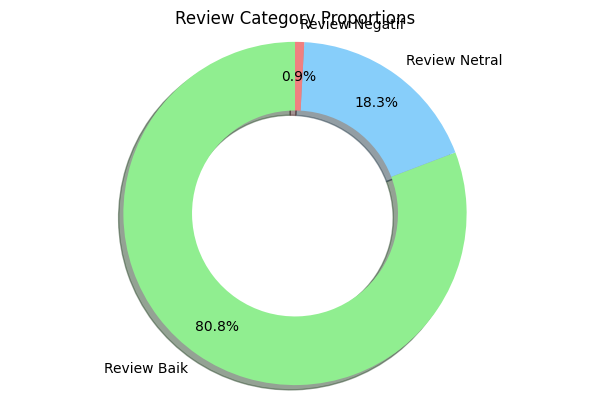

In [24]:
# Function to make a donut chart
def donut(sizes, ax, angle=90, labels=None,colors=None, explode=None, shadow=None):

    # Plot
    ax.pie(sizes, colors = colors, labels=labels, autopct='%.1f%%', 
           startangle = angle, pctdistance=0.8, explode = explode, 
           wedgeprops=dict(width=0.4), shadow=shadow)

    # Formatting
    plt.axis('equal')  
    plt.tight_layout()
    
# Plot arguments
sizes = df.sentiment_label.value_counts()
labels = ['Review Baik', 'Review Netral', 'Review Negatif']
colors = ['lightgreen', 'lightskyblue', 'lightcoral']
explode = (0,0,0)

# Create axes
f, ax = plt.subplots(figsize=(6,4))

# plot donut
donut(sizes, ax, 90, labels, colors=colors, explode=explode, shadow=True)
ax.set_title('Review Category Proportions')

plt.show()

In [3]:
file_path = "C:\\Users\\Ichvan\\Documents\\Kuliah\\Skripsi\\apps\\sentiment_reviews.csv"
df = pd.read_csv(file_path)

df

,stopword,sentiment_label
0,tim burton batman people take comic books seri...,positive
1,losing gaining generation kids batman tim burt...,positive
2,seriously hope director intended film comedy w...,positive
3,story super hero goes batman cut good tim burt...,positive
4,tim burton michael keaton batman pure west ada...,positive
...,...,...
3358,film sense trumped superhero movies realistic ...,positive
3359,watchmen centers around variety human super he...,positive
3360,watchmen favorite book time one famous graphic...,positive
3361,watchmen directed zack snyder adapted screenpl...,negative


In [4]:
# Membagi data menjadi 70% training dan 30% sementara
from sklearn.model_selection import train_test_split


train_df, temp_df = train_test_split(df, test_size=0.3, random_state=42, stratify=df['sentiment_label'])

# Membagi data sementara menjadi 15% testing dan 15% validation
test_df, val_df = train_test_split(temp_df, test_size=0.5, random_state=42, stratify=temp_df['sentiment_label'])

# Menampilkan jumlah data di masing-masing set
print(f'Training set: {len(train_df)} samples')
print(f'Testing set: {len(test_df)} samples')
print(f'Validation set: {len(val_df)} samples')

# Menampilkan data di masing-masing set
print("\nTraining Data")
print(train_df)

print("\nTesting Data")
print(test_df)

print("\nValidation Data")
print(val_df)

Training set: 2354 samples
Testing set: 504 samples
Validation set: 505 samples

Training Data
                                               stopword sentiment_label
2987  loved series season seasons never happened bro...        positive
962   ultimately excellent film seeing part night tr...        positive
1561  movie starts bit slow drags beginning eventual...        positive
1554  long awaited return superman big screen lot go...        positive
1653  worst movie opening promise russell crowe jor ...        negative
...                                                 ...             ...
1663  planet krypton jor el russell crowe killed gen...        positive
732   liked world tim burton created batman movies p...        positive
1131  early comic book adaptations big thing chiefly...        negative
935   film spectacular closest thing seen perfection...        positive
2393  really love film everyone talks gci aquaman mo...        positive

[2354 rows x 2 columns]

Testing Data
  

In [6]:
# Save the resulting dataframe to a new CSV file

# save train df
train_df.to_csv("C:\\Users\\Ichvan\\Documents\\Kuliah\\Skripsi\\apps\\train_reviews.csv", index=False)

#save test df
test_df.to_csv("C:\\Users\\Ichvan\\Documents\\Kuliah\\Skripsi\\apps\\test_reviews.csv", index=False)

# save valid df
val_df.to_csv("C:\\Users\\Ichvan\\Documents\\Kuliah\\Skripsi\\apps\\val_reviews.csv", index=False)


<h1>BERT </h1>

train

In [7]:
file_path = "C:\\Users\\Ichvan\\Documents\\Kuliah\\Skripsi\\apps\\train_reviews.csv"
train_df = pd.read_csv(file_path)

train_df 

,stopword,sentiment_label
0,loved series season seasons never happened bro...,positive
1,ultimately excellent film seeing part night tr...,positive
2,movie starts bit slow drags beginning eventual...,positive
3,long awaited return superman big screen lot go...,positive
4,worst movie opening promise russell crowe jor ...,negative
...,...,...
2349,planet krypton jor el russell crowe killed gen...,positive
2350,liked world tim burton created batman movies p...,positive
2351,early comic book adaptations big thing chiefly...,negative
2352,film spectacular closest thing seen perfection...,positive


test

In [8]:
file_path = "C:\\Users\\Ichvan\\Documents\\Kuliah\\Skripsi\\apps\\test_reviews.csv"
test_df = pd.read_csv(file_path)

test_df

,stopword,sentiment_label
0,marvel movie dark knight superman first half g...,positive
1,level enjoyment top tier start finish dark kni...,positive
2,first offering batman franchise far darkest ve...,positive
3,difference film superman movie astonishing fil...,neutral
4,got back cinema seeing man steel one thing say...,positive
...,...,...
499,best batman rewarding overall cast dutiful com...,positive
500,watched movie released could write review movi...,positive
501,truly inspiring way thinking drastically chang...,positive
502,second installment batman series better first ...,positive


validation

In [9]:
file_path = "C:\\Users\\Ichvan\\Documents\\Kuliah\\Skripsi\\apps\\val_reviews.csv"
val_df_df = pd.read_csv(file_path)

val_df_df

,stopword,sentiment_label
0,amaze see many reviews one way another comes s...,positive
1,batman robin one time favourite movies george ...,positive
2,never cared never like recent superhero movie ...,negative
3,movie extremely poorly conceived every angle e...,positive
4,best thing movie satisfying leave frustrated c...,positive
...,...,...
500,blasting flash gotta spill beans exactly rocke...,positive
501,batman v superman dawn justice bad earning act...,positive
502,unabashedly admit chose favourite super hero a...,positive
503,absolutely adore movie grew movie always speci...,positive


In [10]:
# Set seed for reproducibility.
set_seed(123)

# How many labels are we using in training.
# This is used to decide size of classification head.
n_labels = 3

# GELU Activation function.
ACT2FN = {"gelu": gelu}

# Define BertLayerNorm.
BertLayerNorm = torch.nn.LayerNorm

In [11]:
# Create BertTokenizer.
tokenizer = BertTokenizer.from_pretrained('bert-base-cased')

In [12]:
# Map sentiment labels to numeric values
sentiment_mapping = {'positive': 1, 'negative': -1, 'neutral': 0}

In [13]:
# Apply the mapping to the sentiment_label column
df['sentiment_label'] = df['sentiment_label'].map(sentiment_mapping)

In [14]:
# Ensure there are no NaN values after mapping
df.dropna(subset=['sentiment_label'], inplace=True)

In [15]:
# Extract texts and labels from DataFrame
input_texts = df['stopword'].astype(str).tolist()
labels = df['sentiment_label'].astype(int).tolist()

# Create input sequence using tokenizer
input_sequences = tokenizer(input_texts, add_special_tokens=True, padding=True, truncation=True, return_tensors='pt')


In [16]:
# The tokenizer will return a dictionary of three: input_ids, attention_mask and token_type_ids.
# Let's do a pretty print
print('PRETTY PRINT OF `input_sequences` UPDATED WITH `labels`:')
[print('%s : %s\n' % (k, v)) for k, v in input_sequences.items()]

PRETTY PRINT OF `input_sequences` UPDATED WITH `labels`:
input_ids : tensor([[ 101,  189, 4060,  ...,    0,    0,    0],
        [ 101, 3196, 8289,  ..., 1505, 5263,  102],
        [ 101, 5536, 2810,  ...,    0,    0,    0],
        ...,
        [ 101, 2824, 2354,  ...,    0,    0,    0],
        [ 101, 2824, 2354,  ...,    0,    0,    0],
        [ 101, 1309, 9333,  ...,    0,    0,    0]])

token_type_ids : tensor([[0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]])

attention_mask : tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0]])



[None, None, None]

In [17]:
# Lets see how the text looks like after Bert Tokenizer
# We see the special tokens added
print('ORIGINAL TEXT:')
[print(example) for example in input_texts]
print('\nTEXT AFTER USING `BertTokenizer`:')
[print(tokenizer.decode(example)) for example in input_sequences['input_ids'].numpy()]

ORIGINAL TEXT:
tim burton batman people take comic books seriously adam west batman tv series movie rest us batman role west born play delivers lines seriousness self importance perhaps matched steven seagal seagal trying funny understand comic book fans might dislike movie treat whole batman concept jokey disrespect though really another reviewer pointed top parody old serials however us see inherent silliness notion millionaire playboy dressing bat suit fight supervillains fun watch movie sees well perhaps amusing aspect movie wall view united nations particular ambassadors treated something bureaucrats apparatchiks political cronies could replaced five minutes ten thousand equally capable incapable people
losing gaining generation kids batman tim burton reinvented big screen perception caped crusader become outdated third new films batman forever parodied film series holy joke unfortunately movie question first directed joel schumacher consequently brash bereft wit yes thanks shoema

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

In [18]:
# Create the bert configuration.
bert_configuraiton = BertConfig.from_pretrained('bert-base-cased')

# Let's see number of layers.
print('NUMBER OF LAYERS:', bert_configuraiton.num_hidden_layers)

# We can also see the size of embeddings inside Bert.
print('EMBEDDING SIZE:', bert_configuraiton.hidden_size)

# See which activation function used in hidden layers.
print('ACTIVATIONS:', bert_configuraiton.hidden_act)


NUMBER OF LAYERS: 12
EMBEDDING SIZE: 768
ACTIVATIONS: gelu


In [19]:
# Let' start with the final model how we normally use.
model = BertForSequenceClassification.from_pretrained('bert-base-cased')

# Perform a forward pass. We only care about the output and no gradients.
with torch.no_grad():
  output = model.forward(**input_sequences)

print()

# Let's check how a forward pass output looks like.
print('FORWARD PASS OUTPUT:', output)


A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Pl

RuntimeError: [enforce fail at alloc_cpu.cpp:114] data. DefaultCPUAllocator: not enough memory: you tried to allocate 5289541632 bytes.

In [32]:
# Cleaning before BERT
embedding = 'BERT'

In [40]:
def embeddToBERT(text):
    sentences = re.split('!|\?|\.', text)
    sentences = list(filter(None, sentences))  # Menghapus elemen kosong

    bert_vocabs_of_sentence = []
    
    for sentence in sentences:
        # Tokenisasi teks
        tokens = tokenizer.encode(sentence, add_special_tokens=True, max_length=512, truncation=True)
        # Konversi ke tensor PyTorch
        tokens_tensor = torch.tensor([tokens])
        # Mendapatkan output dari model BERT
        with torch.no_grad():
            outputs = bert_model(tokens_tensor)
            # Ambil rata-rata embedding untuk setiap kata di dalam kalimat
            embeddings = torch.mean(outputs.last_hidden_state, dim=1)
            bert_vocabs_of_sentence.append(embeddings.numpy())

    feature = np.mean(bert_vocabs_of_sentence, axis=0)
    return feature.flatten()

In [41]:
bert_version = 'WORD'
bert_word_training_features = train_df['clean_text_bert'].apply(embeddToBERT)
bert_word_test_features = test_df['clean_text_bert'].apply(embeddToBERT)

In [42]:
feature = [x for x in bert_word_training_features.transpose()]
bert_word_training_features = np.asarray(feature)

feature = [x for x in bert_word_test_features.transpose()]
bert_word_test_features = np.asarray(feature)

print(bert_word_training_features.shape)
     

(2181, 768)


In [43]:
bert_version = 'SENTENCE'
bert_sentence_training_features = train_df['clean_text_bert'].apply(embeddToBERT)
bert_sentence_test_features = test_df['clean_text_bert'].apply(embeddToBERT)

In [44]:
feature = [x for x in bert_sentence_training_features.transpose()]
bert_sentence_training_features = np.asarray(feature)

feature = [x for x in bert_sentence_test_features.transpose()]
bert_sentence_test_features = np.asarray(feature)

print(bert_sentence_training_features.shape)

(2181, 768)


<h1>Classifiers</h1>

<h3>Model & Training & Evaluation & Result</h3>

In [45]:
# A function to plot and print result
def printResult(y_pred, y_prob):
    acc = accuracy_score(test_df["sentiment"], y_pred)
    # Result
    print("Accuracy: {:.2f}".format(acc*100),end='\n\n')
    cm = confusion_matrix(test_df["sentiment"],y_pred)
    print('Confusion Matrix:\n', cm)
    print(classification_report(test_df["sentiment"],y_pred))

    # Plot
    fpr, tpr, thresholds = roc_curve(test_df["sentiment"], y_prob)
    roc_auc = auc(fpr, tpr)
    print ("Area under the ROC curve : %f" % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.plot(fpr, tpr, color='red', label='ROC curve (area = %0.2f)' % roc_auc)
    plt.legend(loc='lower right')

In [46]:
model = SVC(kernel ='linear', C = 1)


In [47]:
# Training 
model.fit(bert_word_training_features, train_df["sentiment"])

# Evaluation
y_pred_bert_words_svm = model.predict(bert_word_test_features)
y_prob_bert_words_svm = model.decision_function(bert_word_test_features)

In [48]:
printResult(y_pred_bert_words_svm, y_prob_bert_words_svm)


Accuracy: 47.44

Confusion Matrix:
 [[  8  79  27]
 [  7 123  50]
 [  7  76  91]]
              precision    recall  f1-score   support

        -1.0       0.36      0.07      0.12       114
         0.0       0.44      0.68      0.54       180
         1.0       0.54      0.52      0.53       174

    accuracy                           0.47       468
   macro avg       0.45      0.43      0.40       468
weighted avg       0.46      0.47      0.43       468



ValueError: multiclass format is not supported

In [49]:
# Training 
model.fit(bert_sentence_training_features, train_df["sentiment"])

# Evaluation
y_pred_bert_sentences_svm = model.predict(bert_sentence_test_features)
y_prob_bert_sentences_svm = model.decision_function(bert_sentence_test_features)

In [50]:
printResult(y_pred_bert_sentences_svm, y_prob_bert_sentences_svm)


Accuracy: 47.44

Confusion Matrix:
 [[  8  79  27]
 [  7 123  50]
 [  7  76  91]]
              precision    recall  f1-score   support

        -1.0       0.36      0.07      0.12       114
         0.0       0.44      0.68      0.54       180
         1.0       0.54      0.52      0.53       174

    accuracy                           0.47       468
   macro avg       0.45      0.43      0.40       468
weighted avg       0.46      0.47      0.43       468



ValueError: multiclass format is not supported

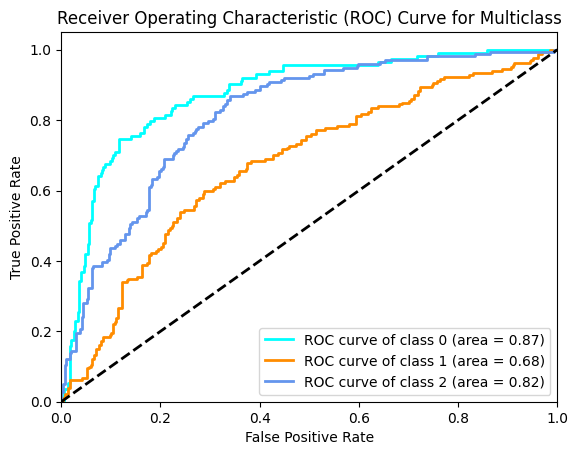

              precision    recall  f1-score   support

          -1       0.64      0.73      0.68       114
           0       0.56      0.59      0.57       180
           1       0.65      0.56      0.60       174

    accuracy                           0.61       468
   macro avg       0.62      0.63      0.62       468
weighted avg       0.62      0.61      0.61       468



In [77]:
# Konversi label ke format biner untuk setiap kelas
n_classes = len(np.unique(test_df["sentiment"]))
y_test_bin = label_binarize(test_df["sentiment"], classes=[-1, 0, 1])
y_score = np.array(y_prob_bert_words_svm)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
colors = ['aqua', 'darkorange', 'cornflowerblue']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.legend(loc="lower right")
plt.show()

# Print classification report
print(classification_report(test_df["sentiment"], y_pred_bert_words_svm))

Confusion Matrix:
 [[ 83  22   9]
 [ 31 106  43]
 [ 15  61  98]]


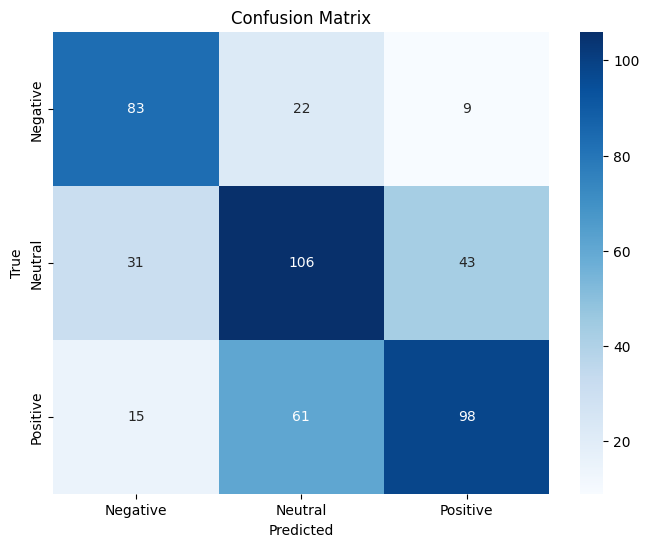

              precision    recall  f1-score   support

    Negative       0.64      0.73      0.68       114
     Neutral       0.56      0.59      0.57       180
    Positive       0.65      0.56      0.60       174

    accuracy                           0.61       468
   macro avg       0.62      0.63      0.62       468
weighted avg       0.62      0.61      0.61       468



In [78]:
# Asumsi y_pred_bert_words_svm adalah prediksi kelas
# y_true adalah label sebenarnya dari data test

# Hitung confusion matrix
cm = confusion_matrix(test_df["sentiment"], y_pred_bert_words_svm)

# Menampilkan confusion matrix
print("Confusion Matrix:\n", cm)

# Visualisasi confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['Negative', 'Neutral', 'Positive'], yticklabels=['Negative', 'Neutral', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Print classification report
print(classification_report(test_df["sentiment"], y_pred_bert_words_svm, target_names=['Negative', 'Neutral', 'Positive']))


              precision    recall  f1-score   support

          -1       0.66      0.68      0.67       114
           0       0.57      0.68      0.62       180
           1       0.73      0.57      0.64       174

    accuracy                           0.64       468
   macro avg       0.65      0.65      0.65       468
weighted avg       0.65      0.64      0.64       468

Area under the ROC curve : 0.414888


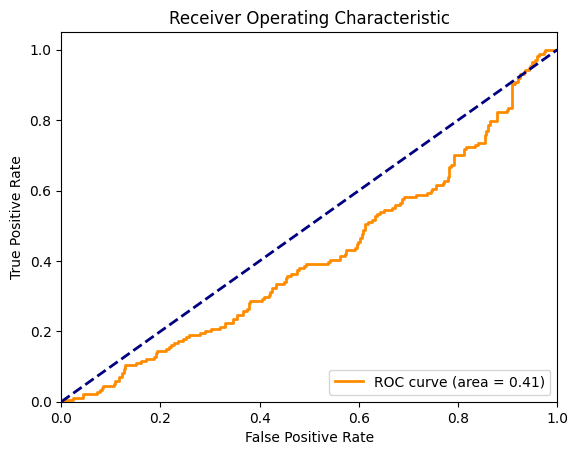

In [79]:
# Pelatihan model SVC
svc_model = SVC(probability=True)
svc_model.fit(list(bert_word_training_features), train_df['sentiment'])

# Prediksi
y_pred_bert_words_svm = svc_model.predict(list(bert_word_test_features))
y_prob_bert_words_svm = svc_model.predict_proba(list(bert_word_test_features))

# Mencetak hasil
from sklearn.metrics import classification_report, roc_curve, auc
import matplotlib.pyplot as plt

def printResult(y_pred, y_prob):
    # Print classification report
    print(classification_report(test_df["sentiment"], y_pred))

    # Plot ROC curve
    fpr, tpr, thresholds = roc_curve(test_df["sentiment"], y_prob[:, 1], pos_label=1)
    roc_auc = auc(fpr, tpr)
    print ("Area under the ROC curve : %f" % roc_auc)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

# Mencetak hasil prediksi dan plot ROC curve
printResult(y_pred_bert_words_svm, y_prob_bert_words_svm)

              precision    recall  f1-score   support

          -1       0.66      0.68      0.67       114
           0       0.57      0.68      0.62       180
           1       0.73      0.57      0.64       174

    accuracy                           0.64       468
   macro avg       0.65      0.65      0.65       468
weighted avg       0.65      0.64      0.64       468

Area under the ROC curve : 0.414888


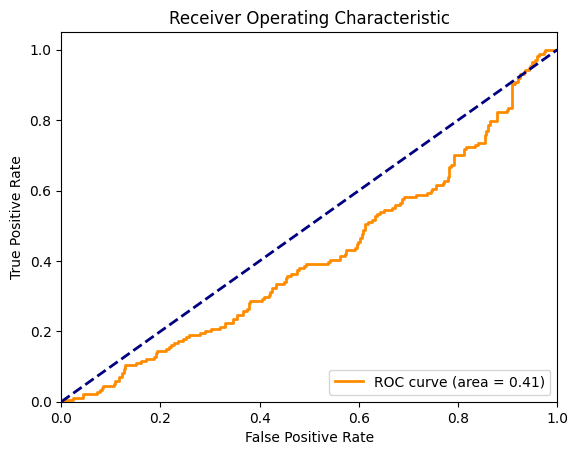

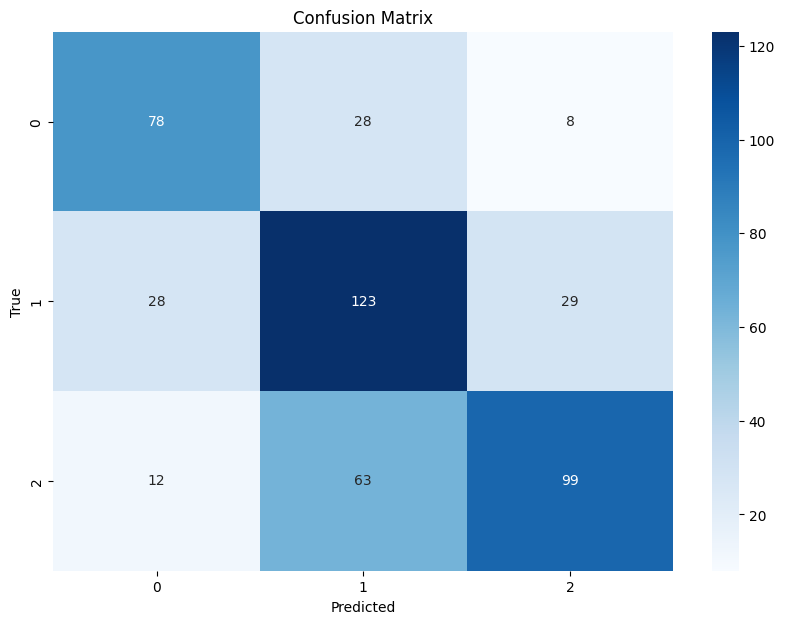

In [80]:
def printResult(y_pred, y_prob):
    # Print classification report
    print(classification_report(test_df["sentiment"], y_pred))

    # Plot ROC curve
    fpr, tpr, thresholds = roc_curve(test_df["sentiment"], y_prob[:, 1], pos_label=1)
    roc_auc = auc(fpr, tpr)
    print("Area under the ROC curve : %f" % roc_auc)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

    # Confusion Matrix
    cm = confusion_matrix(test_df["sentiment"], y_pred)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

# Mencetak hasil prediksi dan plot ROC curve serta confusion matrix
printResult(y_pred_bert_words_svm, y_prob_bert_words_svm)